In [1]:
from models_modified import ViTB16
import torch
from PIL import Image
from torchvision import transforms
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
model = ViTB16(pretrained=True)
model

Pretrained model exists, now loading.
Pretrained model loaded.


ViTB16(
  (patch_pos_emb): PatchAndPosEmb(
    (conv): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  )
  (encoder): TransformerEncoder(
    (layers): Sequential(
      (transformer_layer_0): TransformerEncoderLayer(
        (layer_norm_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mha): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (layer_norm_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLP(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU()
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
        )
      )
      (transformer_layer_1): TransformerEncoderLayer(
        (layer_norm_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mha): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
  

In [3]:
for i,j in model.named_parameters():
    print(i)

patch_pos_emb.cls_token
patch_pos_emb.pos_emb
patch_pos_emb.conv.weight
patch_pos_emb.conv.bias
encoder.layers.transformer_layer_0.layer_norm_1.weight
encoder.layers.transformer_layer_0.layer_norm_1.bias
encoder.layers.transformer_layer_0.mha.in_proj_weight
encoder.layers.transformer_layer_0.mha.in_proj_bias
encoder.layers.transformer_layer_0.mha.out_proj.weight
encoder.layers.transformer_layer_0.mha.out_proj.bias
encoder.layers.transformer_layer_0.layer_norm_2.weight
encoder.layers.transformer_layer_0.layer_norm_2.bias
encoder.layers.transformer_layer_0.mlp.fc1.weight
encoder.layers.transformer_layer_0.mlp.fc1.bias
encoder.layers.transformer_layer_0.mlp.fc2.weight
encoder.layers.transformer_layer_0.mlp.fc2.bias
encoder.layers.transformer_layer_1.layer_norm_1.weight
encoder.layers.transformer_layer_1.layer_norm_1.bias
encoder.layers.transformer_layer_1.mha.in_proj_weight
encoder.layers.transformer_layer_1.mha.in_proj_bias
encoder.layers.transformer_layer_1.mha.out_proj.weight
encoder.l

In [4]:
imagenet_labels = dict(enumerate(open('attention_data/ilsvrc2012_wordnet_lemmas.txt')))

In [5]:
transform = transforms.Compose([
            transforms.CenterCrop(224),
            transforms.Resize(224),

            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

In [6]:
im = Image.open('white fox.png').convert('RGB')
    # im = im.resize((200,300))
x = transform(im)
logit,attn_weights = model(x.unsqueeze(0))


In [7]:
# put all weights together into tensor from list
att_mat = attn_weights
print(att_mat[0].shape)
att_mat = torch.stack(att_mat).squeeze(1)
print('att_mat_mean:', att_mat.shape)

# do residual connections and normalize
residual_att = torch.eye(att_mat.size(1))
aug_att_mat = att_mat + residual_att
aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)
print('aug_att_mat:', aug_att_mat.shape)

# get attention map in joint_attentions
# with method Attention Rollout(see paper for detail)
joint_attentions = torch.zeros(aug_att_mat.size())
joint_attentions[0] = aug_att_mat[0]
for n in range(1, aug_att_mat.size(0)):
    joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])
print('joint_attentions:', joint_attentions.shape)

# attention map of the last layer
v = joint_attentions[-1]
print('v:',v.shape)
# grid_size = 14
grid_size = int(np.sqrt(aug_att_mat.size(-1)))
print('grid_size:', grid_size)
print('v[0]:',v[0].shape)
print('v[0, 1:]:', v[0,1:].shape)
# get the relationship of each patch as mask and put the mask
# on original image
mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
result = (mask * im).astype("uint8")
print('result:', result.shape)

torch.Size([1, 197, 197])
att_mat_mean: torch.Size([12, 197, 197])
aug_att_mat: torch.Size([12, 197, 197])
joint_attentions: torch.Size([12, 197, 197])
v: torch.Size([197, 197])
grid_size: 14
v[0]: torch.Size([197])
v[0, 1:]: torch.Size([196])
result: (381, 250, 3)


Prediction Label and Attention Map!

0.88461 : Arctic_fox, white_fox, Alopex_lagopus
0.01157 : white_wolf, Arctic_wolf, Canis_lupus_tundrarum
0.00471 : grey_fox, gray_fox, Urocyon_cinereoargenteus
0.00100 : red_fox, Vulpes_vulpes
0.00087 : kit_fox, Vulpes_macrotis


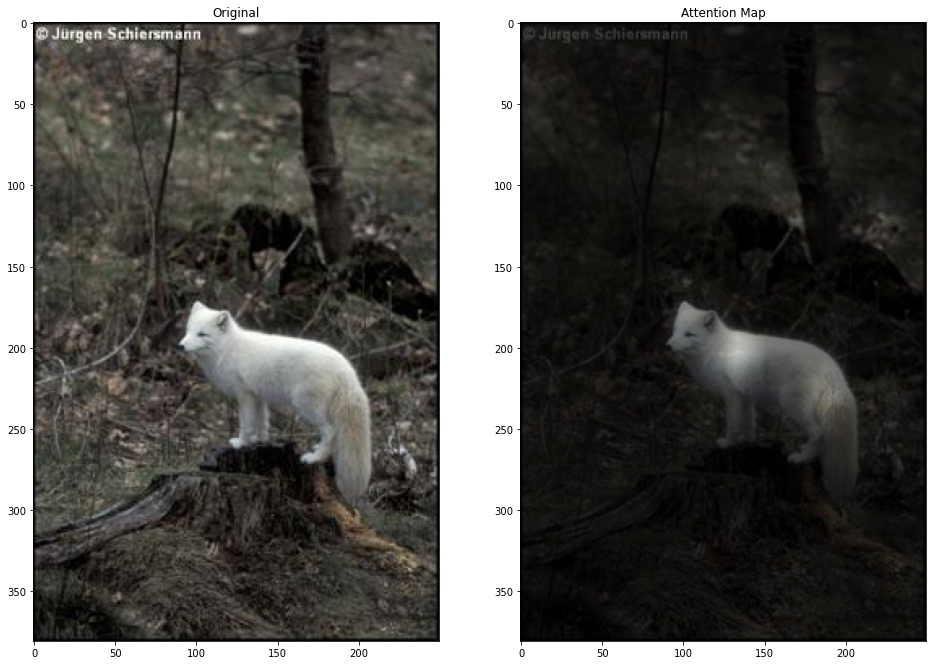

In [8]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))

ax1.set_title('Original')
ax2.set_title('Attention Map')
_ = ax1.imshow(im)
_ = ax2.imshow(result)

probs = torch.nn.Softmax(dim=-1)(logit)
top5 = torch.argsort(probs, dim=-1, descending=True)
print("Prediction Label and Attention Map!\n")
for idx in top5[0, :5]:
    print(f'{probs[0, idx.item()]:.5f} : {imagenet_labels[idx.item()]}', end='')

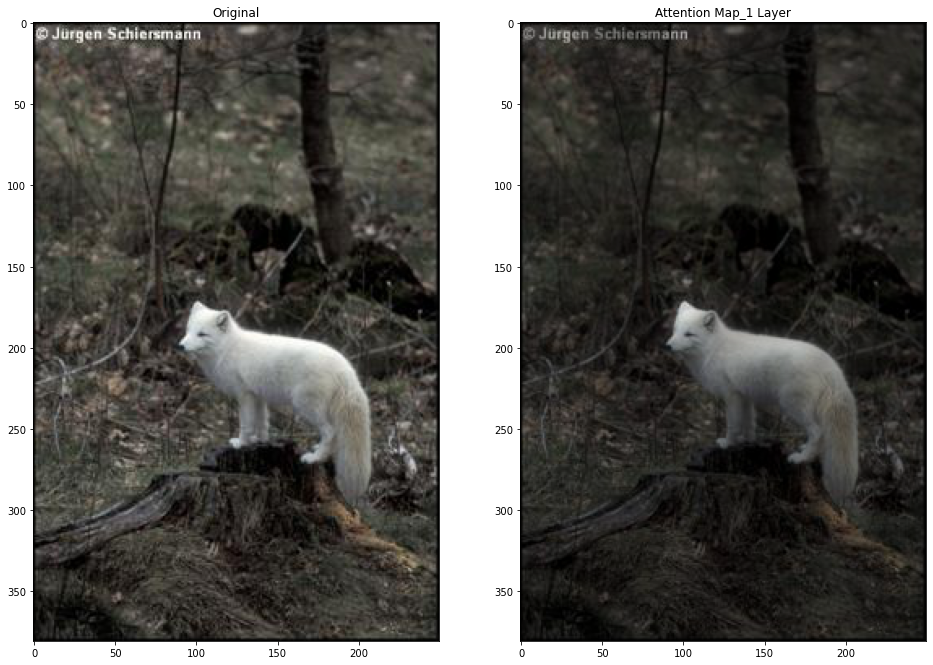

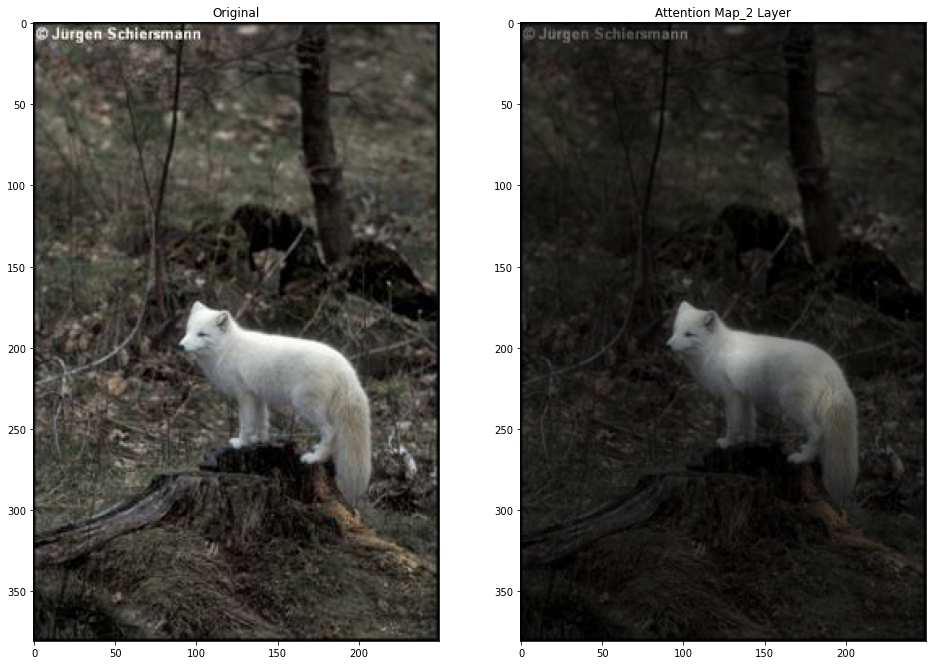

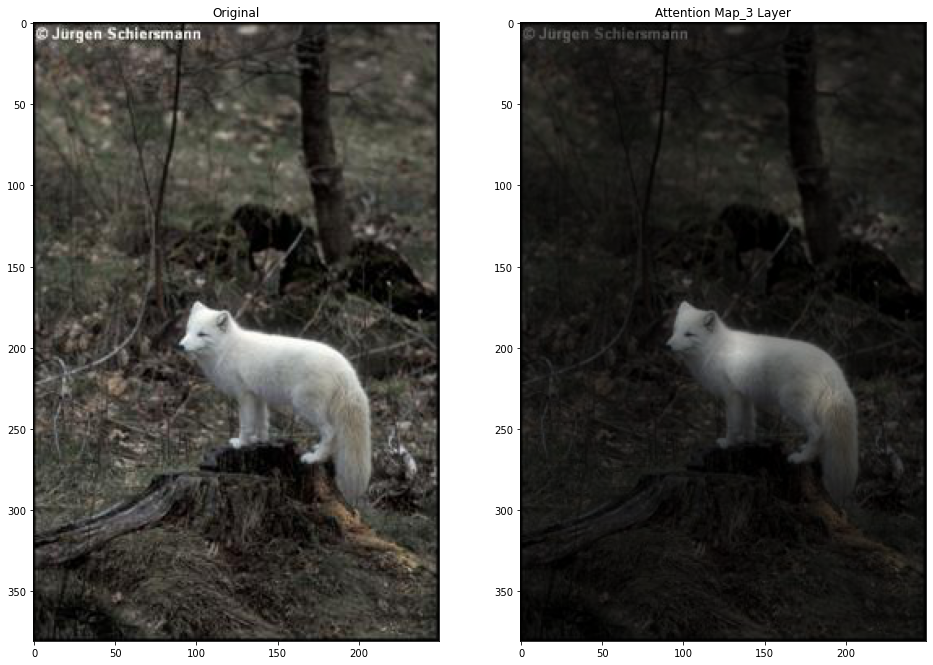

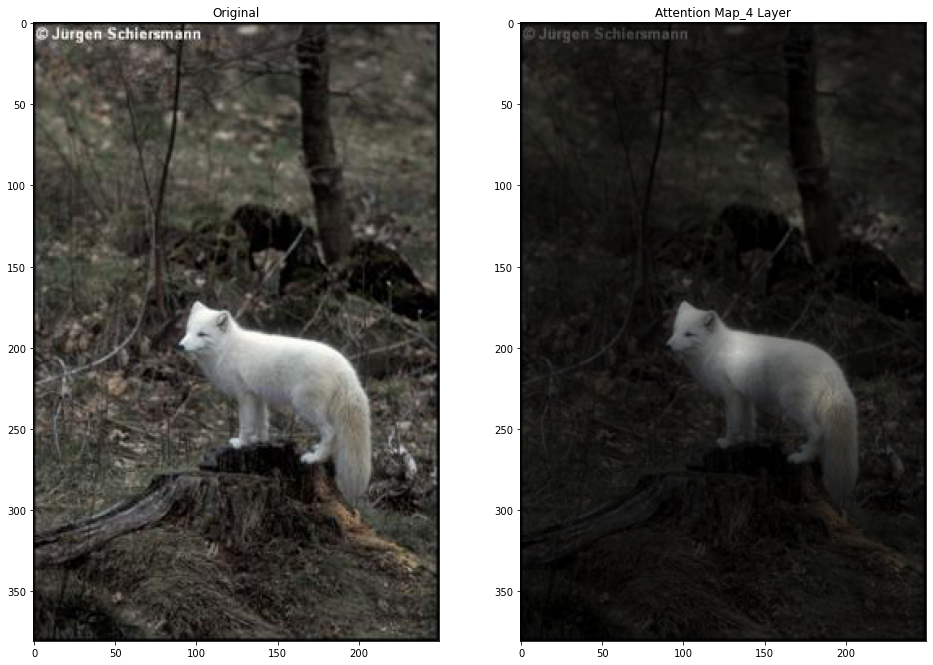

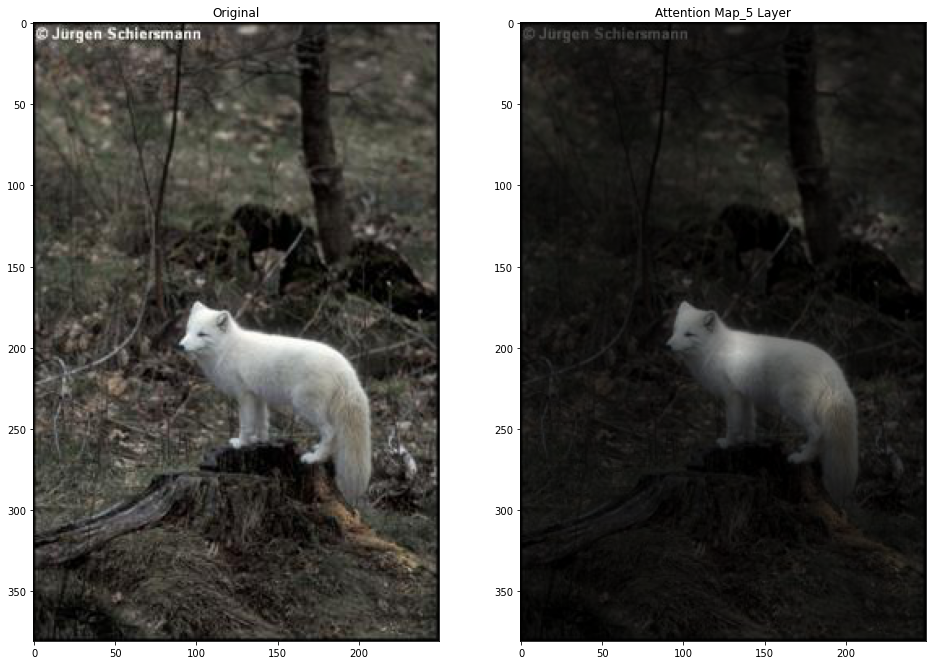

...

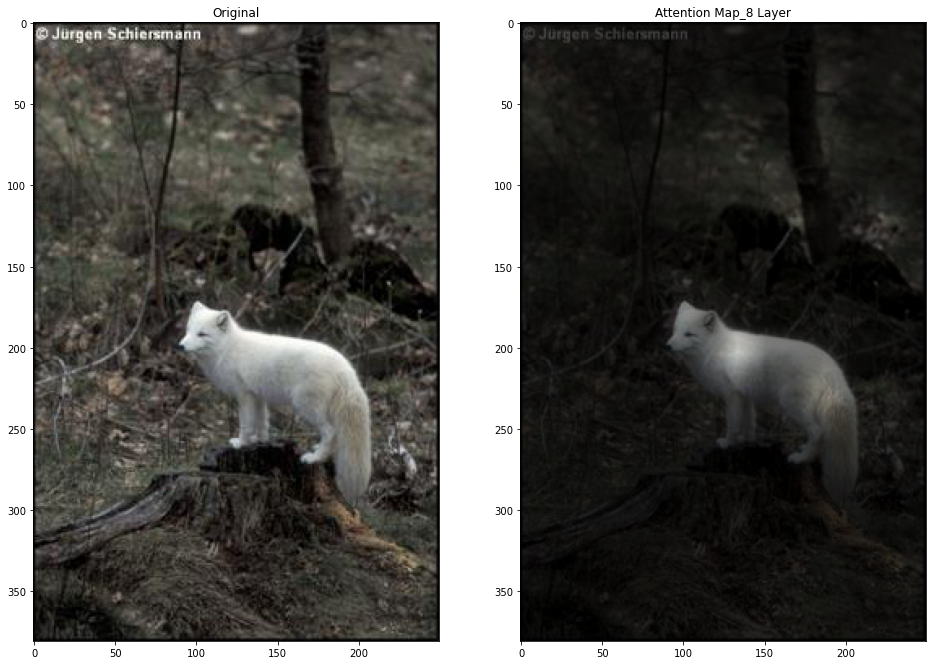

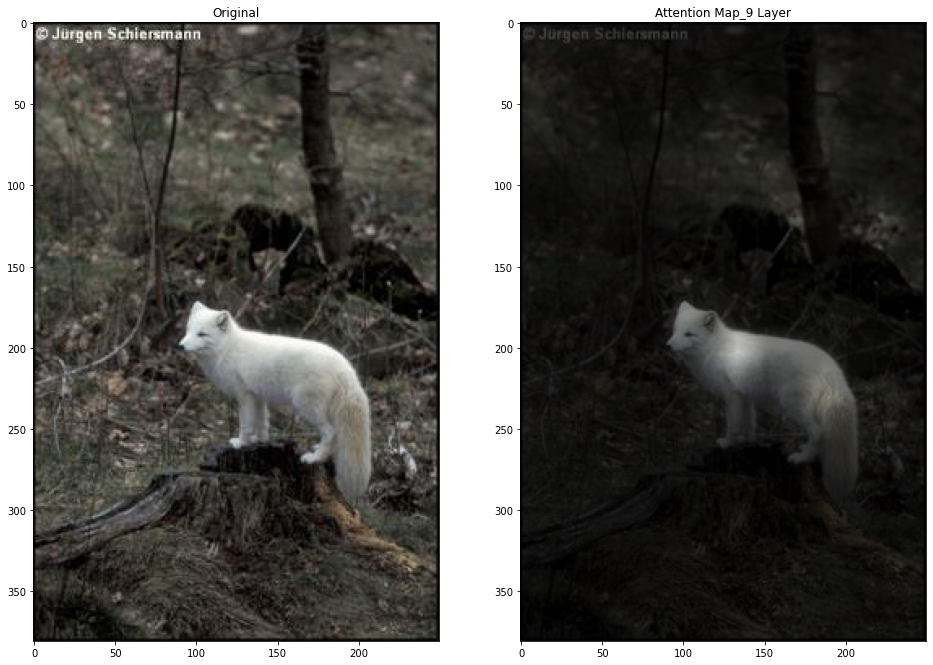

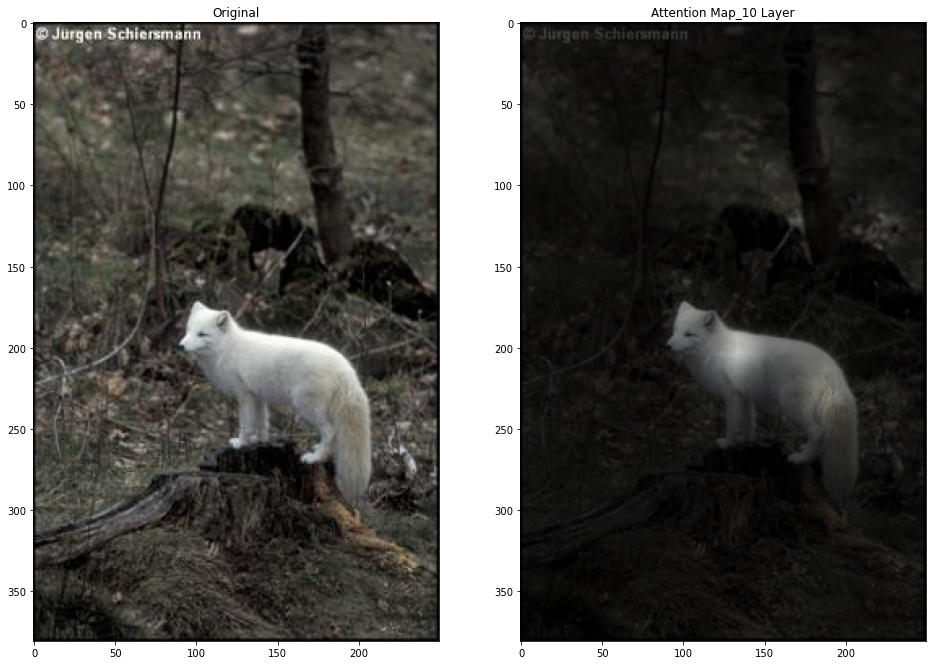

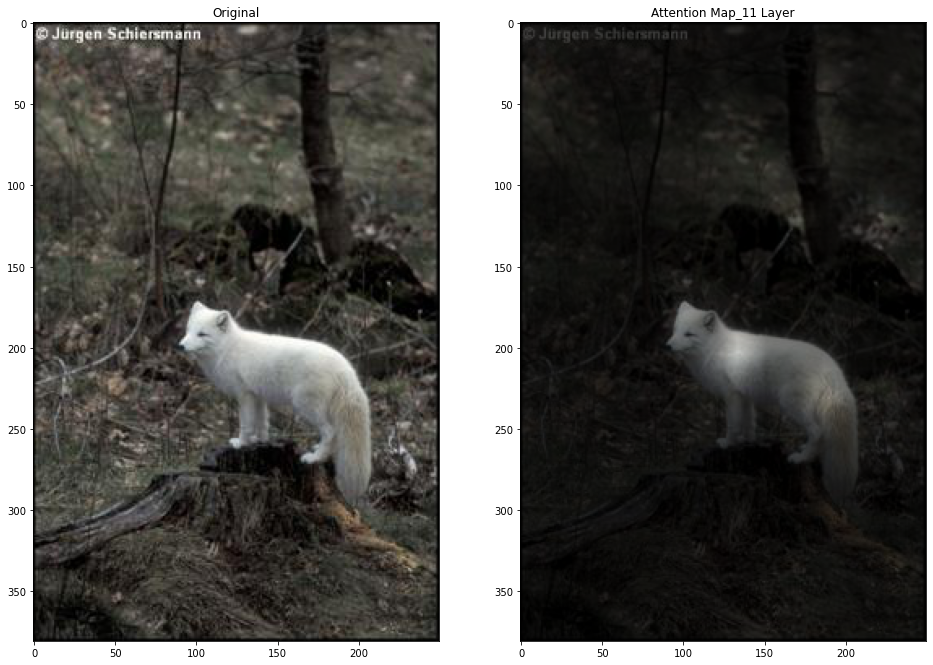

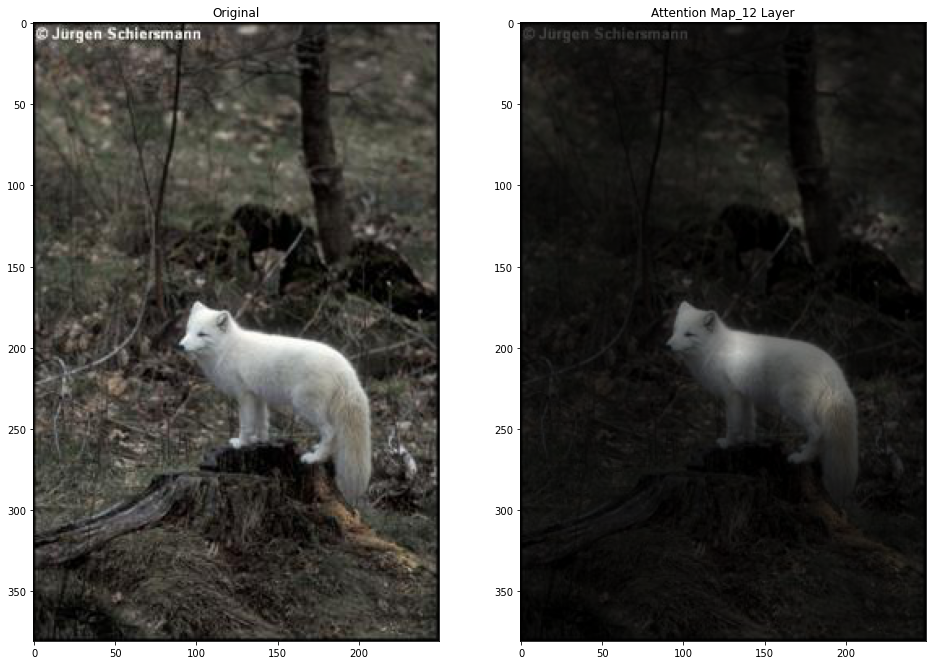

In [9]:
for i, v in enumerate(joint_attentions):
    # Attention from the output token to the input space.
    mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
    mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
    result = (mask * im).astype("uint8")

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
    ax1.set_title('Original')
    ax2.set_title('Attention Map_%d Layer' % (i+1))
    _ = ax1.imshow(im)
    _ = ax2.imshow(result)